In [1]:
# import librarires
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import Dataset
from torchvision import datasets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pickle
import os
from custom_dataset import CustomDataset



import matplotlib.pyplot as plt

from PIL import Image


c:\Users\andre\anaconda3\envs\leaf_cse120_20240303\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
def get_directories(path):
    # Get list of all files and directories in the given path
    contents = os.listdir(path)
    
    # Filter out only directories
    directories = [content for content in contents if os.path.isdir(os.path.join(path, content))]
    
    return directories

In [3]:
CATEGORIES = get_directories('./train')



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [4]:
train_data = pickle.load(open('./train_data.pickle', 'rb'))
val_data = pickle.load(open('./val_data.pickle', 'rb'))

In [5]:
new_train_data = CustomDataset(train_data)
new_val_data = CustomDataset(val_data)

In [6]:
# creating data loaders
loaders = {
    'train' : torch.utils.data.DataLoader(new_train_data, 
                                          batch_size=32, 
                                          shuffle=True, 
                                          num_workers=1),
    
    'test'  : torch.utils.data.DataLoader(new_val_data, 
                                          batch_size=32, 
                                          shuffle=True, 
                                          num_workers=1),
}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x20d65888cd0>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x20d65888fa0>}

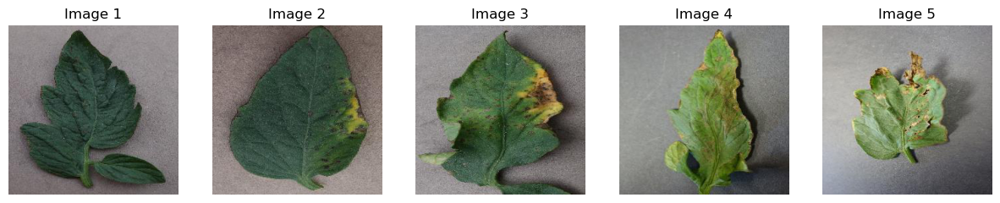

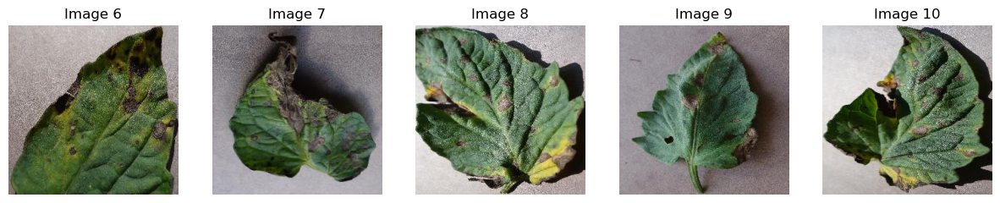

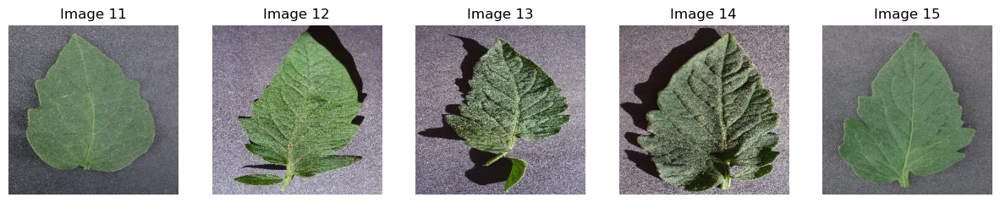

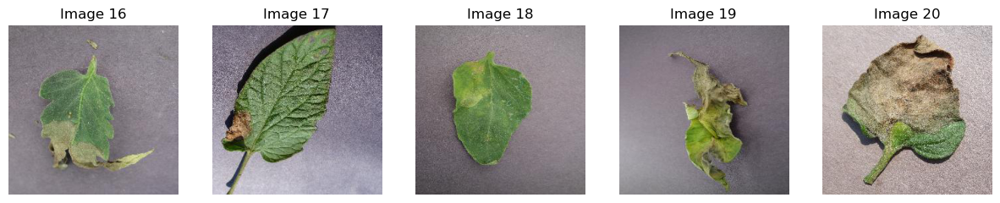

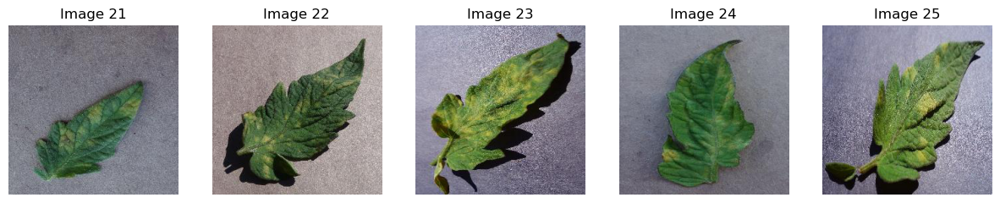

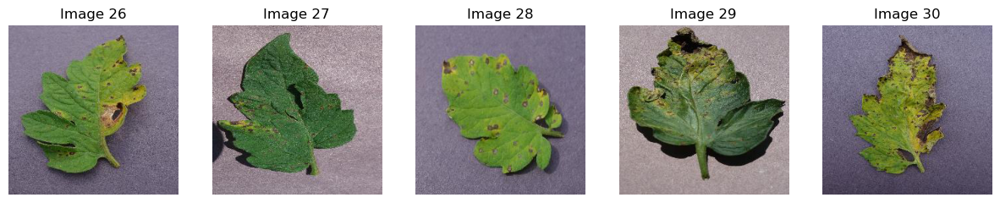

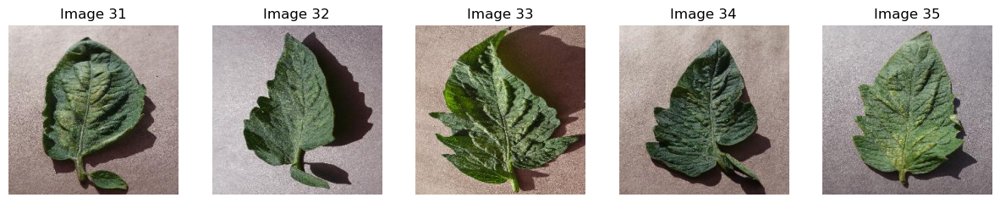

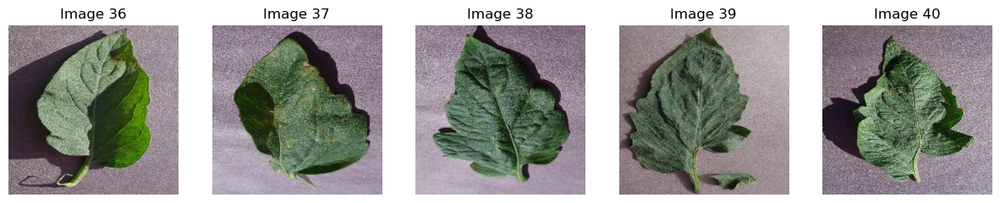

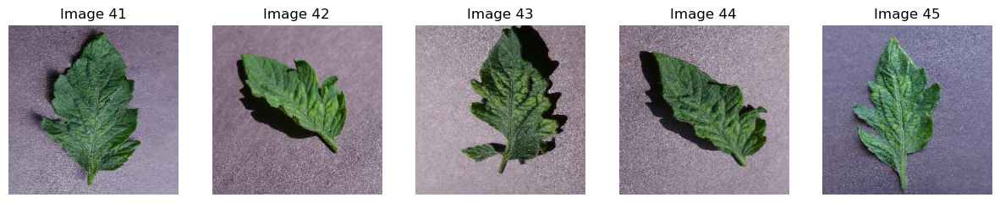

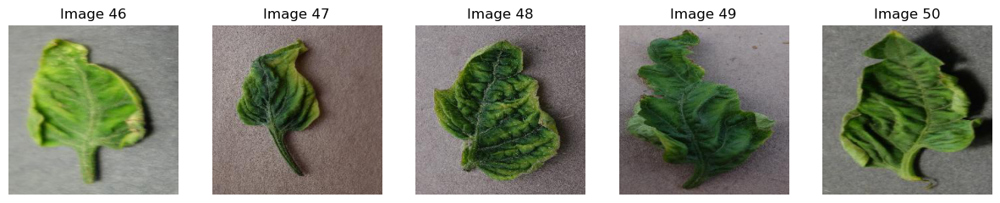

In [7]:

def get_image_paths_in_folders(root_directory, num_images_per_folder=5):
    image_paths = []
    for folder_name in os.listdir(root_directory):
        folder_path = os.path.join(root_directory, folder_name)
        if os.path.isdir(folder_path):
            folder_images = get_image_paths(folder_path)[:num_images_per_folder]
            image_paths.extend(folder_images)
    return image_paths

def get_image_paths(path):
    contents = os.listdir(path)
    image_paths = [os.path.join(path, content) for content in contents if os.path.isfile(os.path.join(path, content)) and content.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
    return image_paths

def get_image_paths_in_folders(root_directory, num_images_per_folder=5):
    image_paths = []
    for folder_name in os.listdir(root_directory):
        folder_path = os.path.join(root_directory, folder_name)
        if os.path.isdir(folder_path):
            folder_images = get_image_paths(folder_path)[:num_images_per_folder]
            image_paths.extend(folder_images)
    return image_paths

def display_images(image_paths, num_images_per_figure=5):
    num_images = len(image_paths)
    num_figures = num_images // num_images_per_figure + (1 if num_images % num_images_per_figure != 0 else 0)
    
    for figure_index in range(num_figures):
        start_index = figure_index * num_images_per_figure
        end_index = min((figure_index + 1) * num_images_per_figure, num_images)
        
        fig, axes = plt.subplots(1, min(num_images_per_figure, end_index - start_index), figsize=(15, 3))
        for i in range(start_index, end_index):
            image_path = image_paths[i]
            image = Image.open(image_path)
            axes[i - start_index].imshow(np.asarray(image))
            axes[i - start_index].axis('off')
            axes[i - start_index].set_title(f"Image {i+1}")
        plt.show()

root_directory = r"C:\Users\andre\Desktop\cse 120 updated\Leaf-Classification\data\tomato\train"
image_paths = get_image_paths_in_folders(root_directory, num_images_per_folder=5)
display_images(image_paths, num_images_per_figure=5)  


In [13]:
# # for when we have more data sets 
# def get_image_paths_in_folders(root_directory, num_images_per_folder=5):
#     image_paths = []
#     for folder_name in os.listdir(root_directory):
#         folder_path = os.path.join(root_directory, folder_name)
#         if os.path.isdir(folder_path):
#             folder_images = get_image_paths(folder_path)[:num_images_per_folder]
#             image_paths.extend(folder_images)
#     return image_paths

# def get_image_paths(path):
#     contents = os.listdir(path)
#     image_paths = [os.path.join(path, content) for content in contents if os.path.isfile(os.path.join(path, content)) and content.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
#     return image_paths

# def display_channel_visualization(image_paths):
#     for image_path in image_paths:
#         image = Image.open(image_path)
#         image_array = np.array(image)
#         red_channel = image_array[:,:,0]
#         green_channel = image_array[:,:,1]
#         blue_channel = image_array[:,:,2]

#         fig, axes = plt.subplots(1, 3, figsize=(15, 5))

#         axes[0].imshow(red_channel, cmap='Reds')
#         axes[0].set_title('Red Channel')
#         axes[0].axis('off')

#         axes[1].imshow(green_channel, cmap='Greens')
#         axes[1].set_title('Green Channel')
#         axes[1].axis('off')

#         axes[2].imshow(blue_channel, cmap='Blues')
#         axes[2].set_title('Blue Channel')
#         axes[2].axis('off')

#         plt.show()

# root_directory = r"C:\Users\andre\Desktop\cse 120 updated\Leaf-Classification\data\tomato\train"
# image_paths = get_image_paths_in_folders(root_directory, num_images_per_folder=5)
# display_channel_visualization(image_paths)


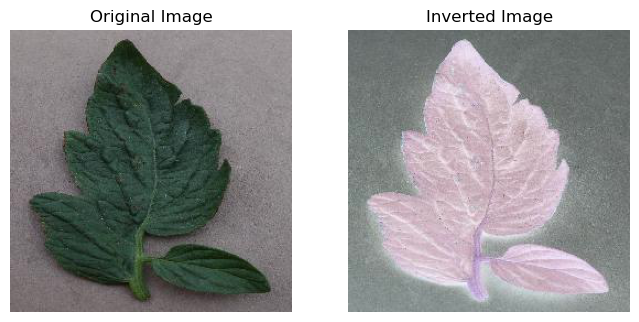

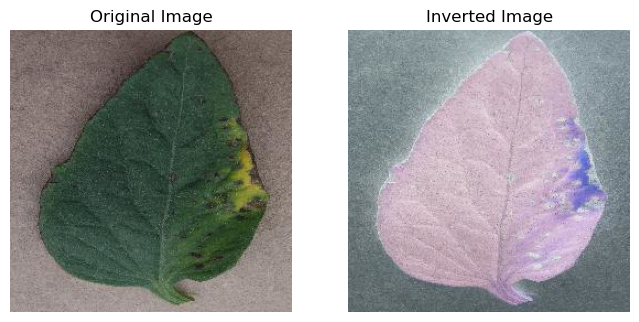

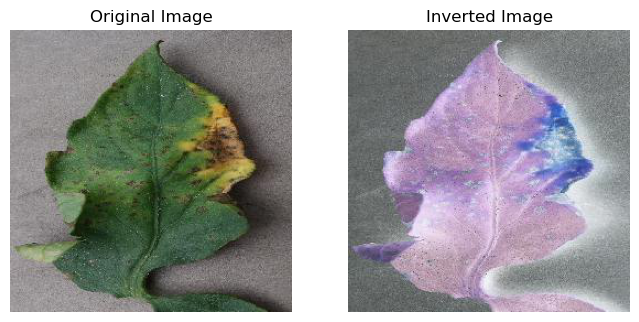

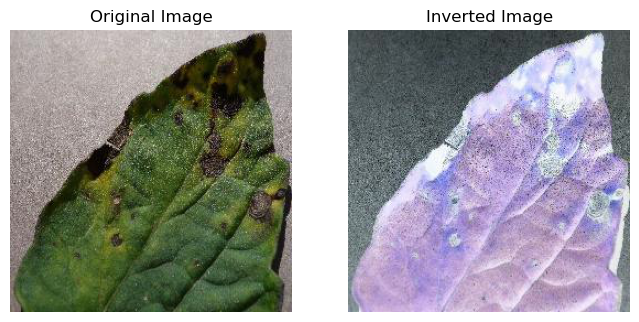

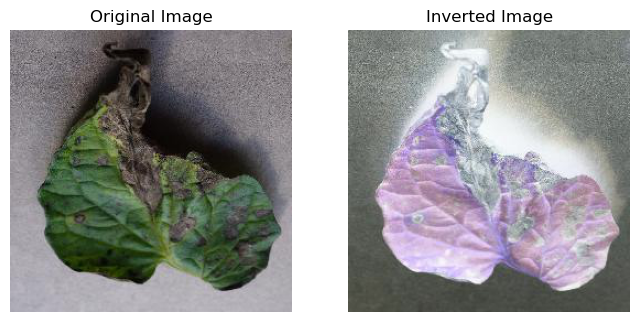

...

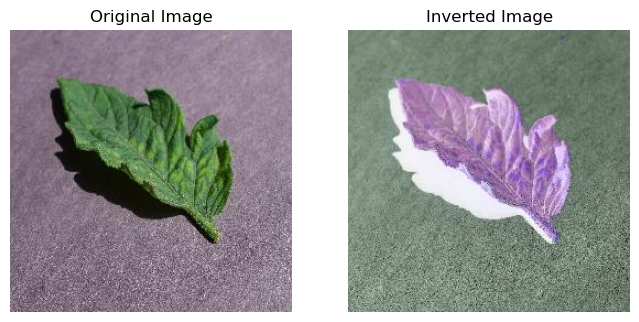

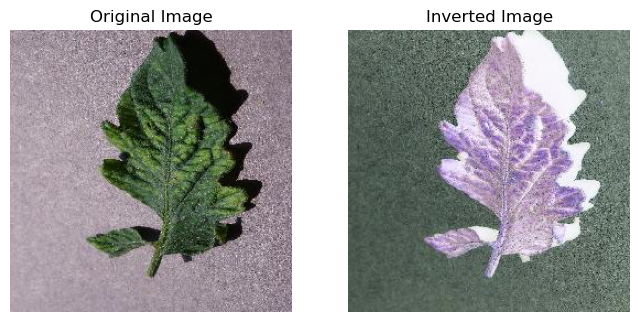

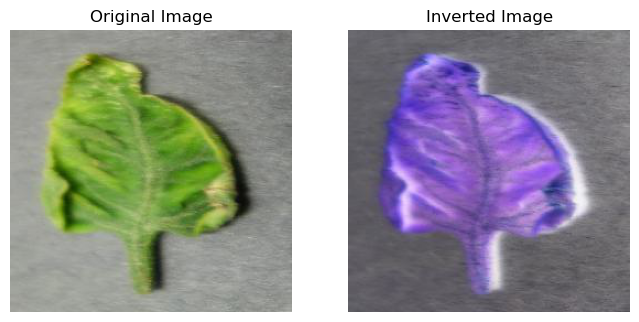

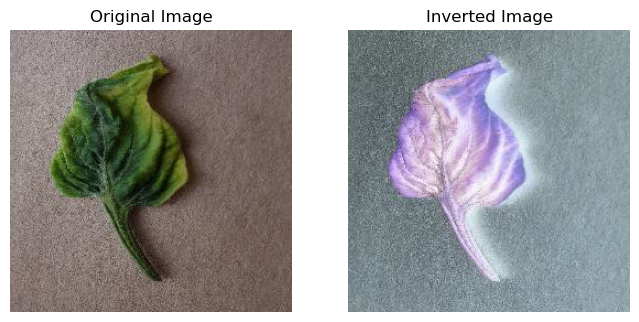

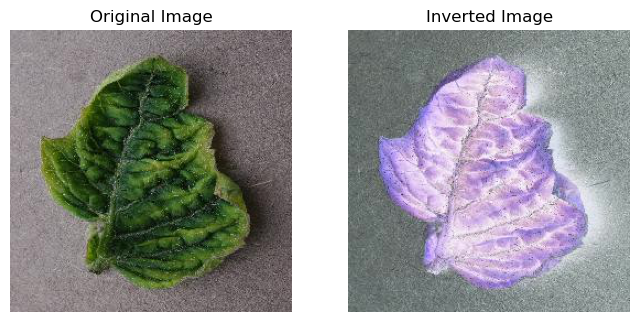

In [18]:

def get_image_paths_in_folders(root_directory, num_images_per_folder=3):
    image_paths = []
    for folder_name in os.listdir(root_directory):
        folder_path = os.path.join(root_directory, folder_name)
        if os.path.isdir(folder_path):  
            folder_images = get_image_paths(folder_path)[:num_images_per_folder]
            image_paths.extend(folder_images)
    return image_paths

def get_image_paths(path):
    contents = os.listdir(path)
    image_paths = [os.path.join(path, content) for content in contents if os.path.isfile(os.path.join(path, content)) and content.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
    return image_paths

def invert_colors(image):
    # Convert the image to a NumPy array
    image_array = np.array(image)
    # Invert the colors by subtracting the image from 255
    inverted_image = 255 - image_array
    # Convert the inverted NumPy array back to an image
    inverted_image = Image.fromarray(inverted_image)
    return inverted_image

def display_inverted_images(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path)
        # Invert the colors of the image
        inverted_image = invert_colors(image)
        # Display the original and inverted images
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(inverted_image)
        plt.title('Inverted Image')
        plt.axis('off')
        plt.show()

root_directory = r"C:\Users\andre\Desktop\cse 120 updated\Leaf-Classification\data\tomato\train"
image_paths = get_image_paths_in_folders(root_directory, num_images_per_folder=3)
display_inverted_images(image_paths)


In [19]:
# design cnn architecture / load pree-trained model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        '''
        Goes through two layers of 2D convolutions, each followed by a 2x2 max pooling
        
        Dimensions:
        1.) Input Shape:          [batch_size, 3, 256, 256]
        
        2.) After conv:           [batch_size, 6, 254, 254]
            After max pooling:    [batch_size, 6, 127, 127]
        
        3.) After conv:           [batch_size, 12, 125, 125]
            After max pooling:    [batch_size, 12, 62, 62]
            
        4.) After flattening:     [batch_size, 12 * 62 * 62]
        '''
        
        self.conv1 = nn.Sequential(         
            nn.Conv2d(
                in_channels=3,              
                out_channels=6,            
                kernel_size=3,              
                stride=1,                   
                padding=0,                  
            ),                              
            nn.ReLU(),                      
            nn.MaxPool2d(kernel_size=2),    
        )
        self.conv2 = nn.Sequential(         
            nn.Conv2d(6, 12, 3, 1, 0),     
            nn.ReLU(),                      
            nn.MaxPool2d(2),                
        )
        # fully connected layer, output 10 classes
        self.out = nn.Linear(12 * 62 * 62, 10)
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        # flatten the output of conv2 to (batch_size, 16 * 8 * 8)
        x = x.view(x.size(0), -1)       
        output = self.out(x)
        return output, x    # return x for visualization

In [20]:
cnn= CNN()
print(cnn)

CNN(
  (conv1): Sequential(
    (0): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(6, 12, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (out): Linear(in_features=46128, out_features=10, bias=True)
)


In [21]:
loss_func = nn.CrossEntropyLoss(); print(loss_func)   
optimizer = torch.optim.Adam(cnn.parameters(), lr= 1e-4); print(optimizer)

CrossEntropyLoss()
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


In [22]:
# validate
def validate(cnn, loader, device, compute_cm=False):
    cnn.eval()
        
    # evaluate the model
    correct = 0
    total = 0
    total_loss = 0
    with torch.no_grad():
        for images, labels in loaders['test']:
            images = images.float().to(device) / 255.0  # Normalize images
            labels = labels.long().to(device)  # Convert labels to the appropriate data type
            
            outputs, _ = cnn(images)
            loss = loss_func(outputs, labels)
            total_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_accuracy = correct / total
    val_loss = total_loss / len(loader)
    return val_accuracy, val_loss

In [23]:
# train
def train(num_epochs, cnn, loaders, device):
    cnn.to(device)
    cnn.train()
    
    # Train the model
    total_step = len(loaders['train'])
    print("INITIATING TRAINING...")
    for epoch in range(num_epochs):
        acc_array = []
        loss_array = []
        val_acc_array = []
        val_loss_array = []
        for i, (images, labels) in enumerate(loaders['train']):
            # convert images and labels into float tensors and normalize
            images = images.float().to(device) / 255.0
            labels = labels.long().to(device)
            
            # gives batch data, normalize x when iterate train_loader
            b_x = Variable(images)   # batch x
            b_y = Variable(labels)   # batch y
            output = cnn(b_x)[0]               
            loss = loss_func(output, b_y)
            
            # measure accuracy and record loss
            train_output, _ = cnn(images)
            pred_y = torch.max(train_output, 1)[1].data.squeeze()
            accuracy = (pred_y == labels).sum().item() / float(labels.size(0))
            

            # clear gradients for this training step   
            optimizer.zero_grad()
            
            # backpropagation, compute gradients 
            loss.backward()
            
            # apply gradients             
            optimizer.step()  
            
            # validate model
            val_accuracy, val_loss = validate(cnn, loaders['test'], device)
            
            # storing results
            acc_array.append(accuracy)
            loss_array.append(loss.item())
            val_acc_array.append(val_accuracy)
            val_loss_array.append(val_loss)
#             epochs_arr.append((i+1) / total_step)
            
            if (i+1) % 25 == 0 or (i+1) == total_step:
                print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.4f}, Validation Accuracy: {:.4f}, Validation Loss: {:.4f}' 
                       .format(epoch + 1, num_epochs, i + 1, total_step, loss.item(), accuracy, val_accuracy, val_loss))                    
            pass
        
        # Averaging results per epoch
        train_acc_data.append(np.mean(acc_array))
        loss_data.append(np.mean(loss_array))
        val_acc_data.append(np.mean(val_acc_array))
        val_loss_data.append(np.mean(val_loss_array))
        
        # Logging results per epoch
        print("\n-----------------------------------------------------------------------------------------------------------------------------\n")
        print(f"EPOCH {epoch+1} RESULTS:")
        print("AVG TRAIN ACCURACY: {:.4f}, AVG TRAIN LOSS: {:.4f}, AVG VAL ACCURACY: {:.4f}, AVG VAL LOSS: {:.4f}"
              .format(train_acc_data[epoch], loss_data[epoch], val_acc_data[epoch], val_loss_data[epoch]))
        print("\n-----------------------------------------------------------------------------------------------------------------------------\n")
        
        pass
    
    
    pass

In [24]:
def compute_cm(cnn, loader, device):
    cnn.eval()
        
    # evaluate the model
    correct = 0
    total = 0
    total_loss = 0
    with torch.no_grad():
        for images, labels in loaders['test']:
            images = images.float().to(device) / 255.0  # Normalize images
            labels = labels.long().to(device)  # Convert labels to the appropriate data type
            
            outputs, _ = cnn(images)
            loss = loss_func(outputs, labels)
            total_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_accuracy = correct / total
    val_loss = total_loss / len(loader)
    return val_accuracy, val_loss

In [25]:
def compute_confusion_matrix(model, loader):
    model.eval()
    
    all_predicted = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.float() / 255.0  # Normalize images
            labels = labels.long()  # Convert labels to the appropriate data type
            
            outputs, _ = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            # Collect predicted labels and true labels for confusion matrix
            all_predicted.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    cm = confusion_matrix(all_labels, all_predicted)
    
    return cm

In [26]:
# training and validating
num_epochs = 3
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
train_acc_data = []
loss_data = []
val_acc_data = []
val_loss_data = []
epochs_arr = []

train(num_epochs, cnn, loaders,device)

INITIATING TRAINING...
Epoch [1/3], Step [25/313], Loss: 2.2386, Accuracy: 0.0625, Validation Accuracy: 0.1190, Validation Loss: 2.2146
Epoch [1/3], Step [50/313], Loss: 2.0597, Accuracy: 0.4375, Validation Accuracy: 0.3620, Validation Loss: 2.0607
Epoch [1/3], Step [75/313], Loss: 1.9808, Accuracy: 0.4062, Validation Accuracy: 0.2670, Validation Loss: 1.9646
Epoch [1/3], Step [100/313], Loss: 1.9575, Accuracy: 0.4688, Validation Accuracy: 0.4240, Validation Loss: 1.8462
Epoch [1/3], Step [125/313], Loss: 1.6230, Accuracy: 0.4688, Validation Accuracy: 0.3780, Validation Loss: 1.7851
Epoch [1/3], Step [150/313], Loss: 1.5718, Accuracy: 0.5312, Validation Accuracy: 0.4880, Validation Loss: 1.6571
Epoch [1/3], Step [175/313], Loss: 1.7026, Accuracy: 0.5000, Validation Accuracy: 0.5260, Validation Loss: 1.5746
Epoch [1/3], Step [200/313], Loss: 1.3198, Accuracy: 0.5312, Validation Accuracy: 0.5160, Validation Loss: 1.5393
Epoch [1/3], Step [225/313], Loss: 1.4780, Accuracy: 0.5312, Validat

/var/folders/rj/gwmtr5qj72g1yp53gy3xhz9m0000gn/T/ipykernel_17240/887425931.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 1000x500 with 0 Axes>

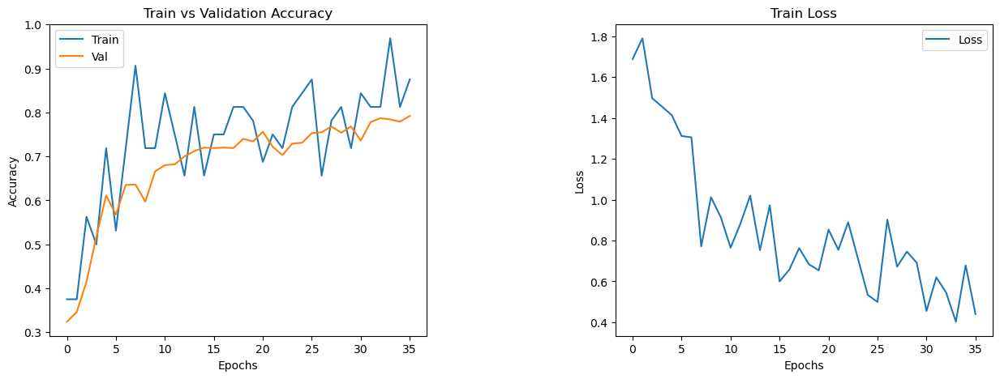

In [ ]:
# performance analysis (loss, accuracy, cm)
plt.figure(figsize=(10,5))
fig, axs = plt.subplots(1,2, figsize=(15, 5), gridspec_kw={'wspace': 0.5})

axs[0].plot(train_acc_data, label='Train')
axs[0].plot(val_acc_data, label='Val')
axs[0].set_title('Train vs Validation Accuracy')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Accuracy')
axs[0].legend()


axs[1].plot(loss_data, label='Train Loss')
axs[1].plot(val_loss_data, label='Val Loss')
axs[1].set_title('Train Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].legend()

plt.tight_layout()
plt.show()